# Analysis of credit card transactions dataset



---


This notebook presents exploratory data analysis of kaggle dataset with credit card transactions using Python. Here are some key points:

1. Notebook configuration
2. Dataset exploration
3. Classification by category
4. Detectiong spending patterns
5. Data corealations
6. Fraudlent transactions detection
7. Summary

**Side note:**
As of now, there is a looker dashboard being created for this project to better visualize some aspects of the analysis.






> You might not be able to run this notebook due to the fact that the path set for the dataset is strictly set to my preferences. There are two ways to fix that:

1. Download the dataset from [here](https://www.kaggle.com/datasets/priyamchoksi/credit-card-transactions-dataset), upload it to your own drive and change the path below to the one that suits you
2. Go to my [Github](https://github.com/MarcinZ20/Credit_card_transactions_fraud_detection) and go from there!



In [ ]:
dataset_path = './drive/MyDrive/Data Analysis/credit_card_transactions.csv'

## Notebook configuration

In [ ]:
!pip install folium matplotlib mapclassify
!pip install gspread
!pip install kaggle

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import datetime
import folium
from folium import plugins
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
sns.set_theme(context='notebook', palette='pastel', style='darkgrid')

## Dataset exploration

In [ ]:
df = pd.read_csv(filepath_or_buffer=dataset_path)

In [ ]:
df.shape

(1296675, 24)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 24 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

In [ ]:
df.sample(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
732683,732683,2019-11-09 15:15:04,4229733778084049,fraud_Beer-Jast,kids_pets,139.11,Tyler,Mills,M,7838 Jason Squares,...,-85.8784,48194,Surgeon,1990-05-03,e8d076cd60fe2c4cdfb79fcfada20481,1352474104,37.525723,-85.586462,0,42716.0
1205539,1205539,2020-05-18 22:39:14,4364010865167176,fraud_Jast and Sons,food_dining,18.67,Gary,Martinez,M,03512 Jackson Ports,...,-119.7957,276896,Immunologist,1997-03-12,20b3a36410fc1c9f82977edfb17f9bc2,1368916754,39.017319,-118.862578,0,NaN
824815,824815,2019-12-09 13:58:52,60416207185,fraud_Stark-Koss,home,32.48,Mary,Diaz,F,9886 Anita Drive,...,-108.8964,1645,Information systems manager,1986-02-17,a05790da92296a39ab1c81087f9e52ca,1355061532,43.878918,-109.326736,0,NaN
1167412,1167412,2020-05-02 15:41:38,374930071163758,fraud_Brown-Greenholt,entertainment,85.63,Daniel,Escobar,M,61390 Hayes Port,...,-83.3583,31515,Police officer,1971-11-05,e29ee3e3d8f5c204507d007ab1c66003,1367509298,42.916569,-82.462594,0,48040.0
664287,664287,2019-10-10 09:32:52,675961917837,fraud_Kris-Padberg,shopping_pos,11.41,Christopher,Cummings,M,478 George Course Apt. 056,...,-96.7456,142,Chiropodist,1967-08-24,21b47fb4ac618ad02320d140678e1078,1349861572,39.708371,-96.144868,0,66415.0


In [ ]:
df = df.drop(columns=['Unnamed: 0'], axis=1)
df['trans_date_trans_time'] = pd.to_datetime(df.trans_date_trans_time, format='%Y-%m-%d %H:%M:%S')
df['dob'] = pd.to_datetime(df.dob, format='%Y-%m-%d')

## Classification by category

We categorize the data to better understand spending behaviours and identify patterns to suit future customers.

In [ ]:
len(df.category.unique())

14

In [ ]:
spending_categories = df.category.value_counts()

### Spending categories

After reviewing the chart below, we can clearly see that people still prefer to shop for groceries localy, rather than online. The same applies to the shopping category, but the difference is much smaller.

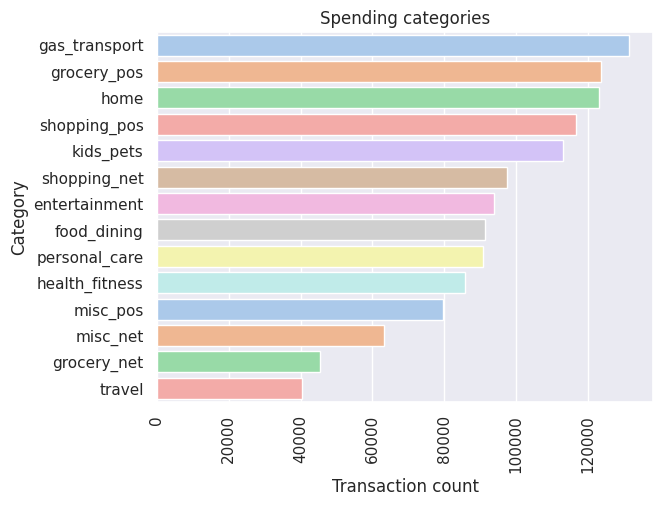

In [ ]:
sns.countplot(df.category, palette='pastel', order=df.category.value_counts().index).set(title='Spending categories')
plt.xticks(rotation=90)
plt.xlabel('Transaction count')
plt.ylabel('Category')
plt.show()

### Money spent on each category

Now, let us see how much money was spent on each respective category

In [ ]:
amt_money_spent = df.groupby('category')['amt'].sum().reset_index().sort_values(by='amt', ascending=False)

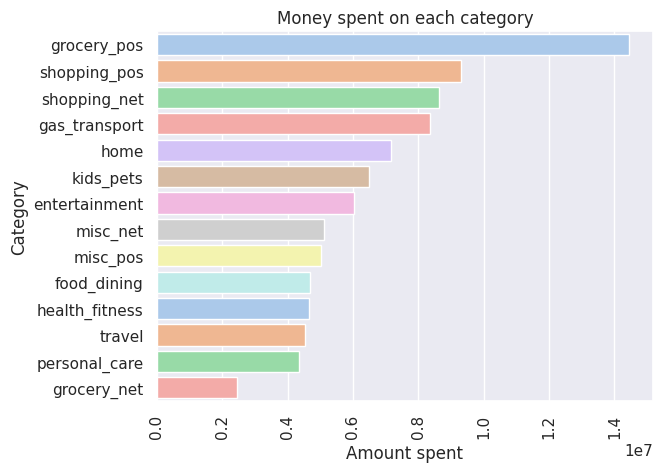

In [ ]:
sns.barplot(data=amt_money_spent, x='amt', y='category', palette='pastel').set(title='Money spent on each category')
plt.xticks(rotation=90)
plt.xlabel('Amount spent')
plt.ylabel('Category')
plt.show()

The difference between shopping for groceries is even more apparent here.

### Spending differences between genders

Now let us explore the differences between spendings of males and females on each category. To achieve that, we must:
1. create a subset of df
2. group it by gender and category
3. calculate the mean of the **amt** column
4. reset the index to provide an appropriate format for plotting

In [ ]:
sp_mean = df.groupby(['gender', 'category'])['amt'].mean().reset_index()

These are average spendings per category divided by genders. As we can see in most cases, the amount spent by either one of the two genders is pretty similar. However there are two areas that stand out:
1. The average amount spent on **groceries** by females is higher than the average amount spent by males
2. The average amount spent on **travel** by males is significantly higher than the average amount spent by females

This tells us, that for example when providing ads for our customers, we should focus on targeting males with travel oriented ads.


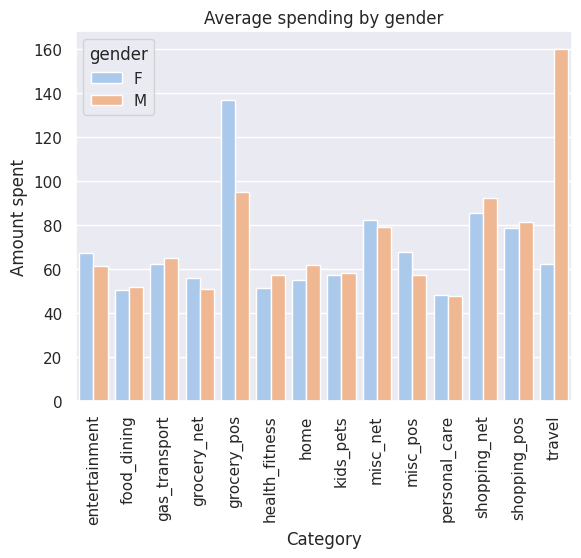

In [ ]:
sns.barplot(data=sp_mean, x='category', y='amt', hue='gender', palette='pastel')\
.set(title='Average spending by gender')
plt.xticks(rotation=90)
plt.xlabel('Category')
plt.ylabel('Amount spent')
plt.show()


### Shopping trends throughout the year

Now let us determine the months of with the highest count of recorded transactions and highest ammount of money spent. For simplicity we will only consider 2k19, due to the fact that we don't have all the data from 2k20.

In [ ]:
shopping_df = df[df.category.isin(['shopping_net', 'shopping_pos'])]

shopping_2k19 = shopping_df[shopping_df.trans_date_trans_time.dt.year == 2019]
shopping_2k19_transactions = shopping_2k19.groupby(shopping_2k19.trans_date_trans_time.dt.month)['trans_date_trans_time'].count().reset_index(name='count')
shopping_2k19_spendings = shopping_2k19.groupby(shopping_2k19.trans_date_trans_time.dt.month)['amt'].sum().reset_index(name='sum')

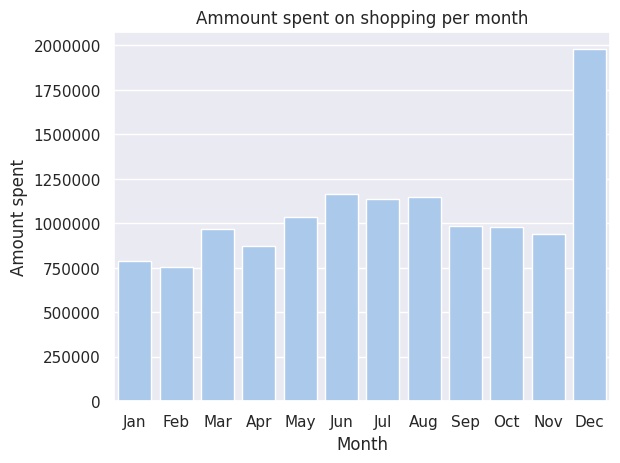

In [ ]:
sns.barplot(data=shopping_2k19_spendings, x='trans_date_trans_time', y='sum')\
.set(title='Ammount spent on shopping per month')
plt.xticks(ticks=np.arange(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.ticklabel_format(axis='y', style='plain', useLocale=True)
plt.xlabel('Month')
plt.ylabel('Amount spent')
plt.show()

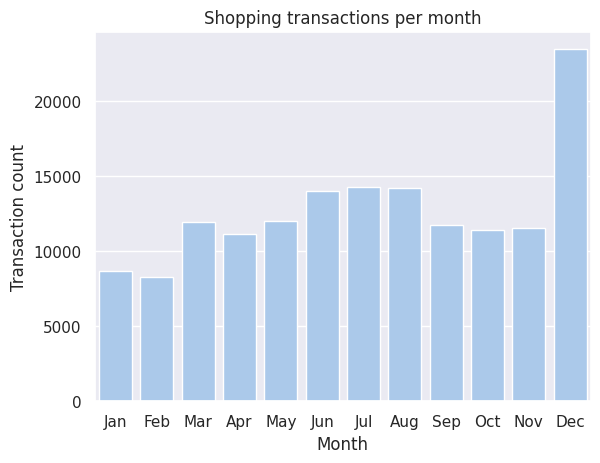

In [ ]:
sns.barplot(data=shopping_2k19_transactions, x='trans_date_trans_time', y='count')\
.set(title='Shopping transactions per month')
plt.xticks(ticks=np.arange(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.xlabel('Month')
plt.ylabel('Transaction count')
plt.show()

As we can see December is the winner here. Probably due to Christmas time, people tend to do more shopping. Also there is a slide bump during the holiday period.

## Detecting spending patterns

We're going to work on detecting some user spending patterns. First, let's see who spent the most.

**Side note:** We're only going to use the data from 2k19

In [ ]:
user_spendings = df[df.trans_date_trans_time.dt.year == 2019]\
  .groupby(['cc_num', 'gender', 'dob'])['amt']\
  .sum()\
  .reset_index(name='sum')\
  .sort_values(by='sum', ascending=False)\
  .head(10)

In [ ]:
user_spendings

,cc_num,gender,dob,sum
802,6011367958204270,F,1988-09-15,215433.71
808,6011438889172900,F,1993-04-08,204464.18
754,4908846471916297,F,1992-07-24,202154.69
320,344709867813900,F,1986-01-30,201079.01
440,2712209726293386,F,1977-02-22,200905.83
826,6011893664860915,F,1975-07-31,200377.62
791,6011109736646996,F,1983-02-08,199563.61
250,180048185037117,F,1974-07-19,196146.19
277,213141712584544,F,1984-12-24,195737.40
477,3521417320836166,F,1975-11-30,195362.25


It looks like the first 10 people to spend the most are female. Let's dive into the analysis a little more. Here are some new ideas:
1. Find out their spendings throughout the year
2. Find out their highest transaction
3. Find out their jobs
4. Find out where they live (city population can matter)

I'm also interested in spendings of different age groups so I guess we will find out some more about that.

### Spendings throughout the year

In [ ]:
cc_numbers = user_spendings.cc_num.values

user_df = df[df.cc_num.isin(cc_numbers)]
user_df = user_df[user_df.trans_date_trans_time.dt.year == 2019]
user_df = user_df.groupby([user_df.trans_date_trans_time.dt.month, 'cc_num', 'first', 'last'])['amt']\
  .sum()\
  .reset_index(name='sum')

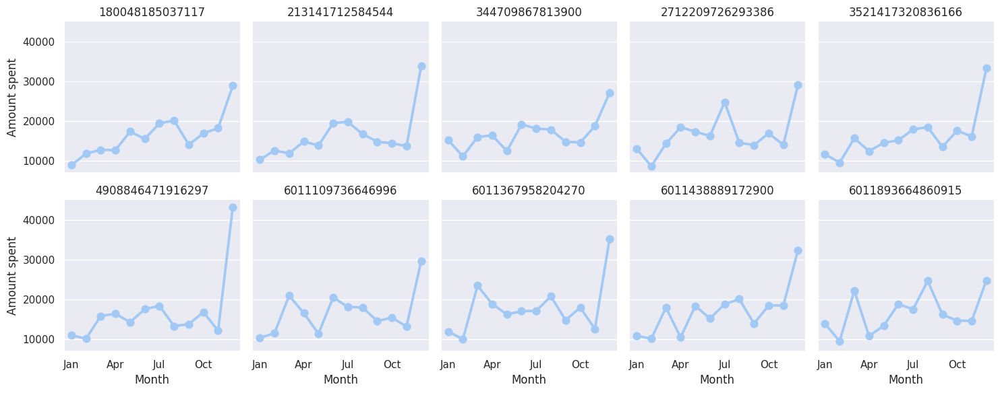

In [ ]:
g = sns.FacetGrid(data=user_df, col='cc_num', col_wrap=5)
g.map(sns.pointplot, 'trans_date_trans_time', 'sum')
g.set_axis_labels('Month', 'Amount spent')
g.set(xticks=np.arange(0, 12, 3))
g.set_xticklabels(['Jan', 'Apr', 'Jul', 'Oct'])
g.set_titles(col_template='{col_name}')

The pattern is pretty similar - first two months are rather 'slow', then there is a slight increase during the holiday period and of course the highest spendings are noted in december.

### The highest transaction

Here are the highest transactions made by people who spent the most. Below there is a table with overal highest transactions.

In [ ]:
highest_transactions = df[df.cc_num.isin(cc_numbers)]
highest_transactions = highest_transactions[df.trans_date_trans_time.dt.year == 2019]
highest_transactions = highest_transactions.groupby(['cc_num', 'first', 'last', 'trans_date_trans_time', 'category'])
highest_transactions = highest_transactions.agg({'amt': 'sum'}).reset_index()
highest_transactions = highest_transactions.sort_values(by='amt', ascending=False).head(10)

In [ ]:
highest_transactions

,cc_num,first,last,trans_date_trans_time,category,amt
15684,6011367958204270,Tammy,Ayers,2019-03-20 17:23:37,travel,8524.52
20107,6011893664860915,Erin,Chavez,2019-03-16 22:27:57,travel,8217.23
7700,2712209726293386,Jenna,Brooks,2019-07-23 14:08:29,travel,7486.04
12795,4908846471916297,Lauren,Torres,2019-12-04 19:11:18,travel,6994.53
13071,4908846471916297,Lauren,Torres,2019-12-28 19:50:47,travel,5470.67
17436,6011367958204270,Tammy,Ayers,2019-12-21 17:53:12,travel,3991.60
15839,6011367958204270,Tammy,Ayers,2019-04-20 14:24:44,travel,3923.87
11413,4908846471916297,Lauren,Torres,2019-04-13 22:46:17,travel,3633.17
14125,6011109736646996,Rebecca,Erickson,2019-07-07 16:04:40,travel,2808.95
20116,6011893664860915,Erin,Chavez,2019-03-17 17:17:50,shopping_pos,2353.22


In [ ]:
highest_transactions = df[df.trans_date_trans_time.dt.year == 2019]
highest_transactions = highest_transactions.groupby(['cc_num', 'first', 'last', 'trans_date_trans_time', 'category'])
highest_transactions = highest_transactions.agg({'amt': 'sum'}).reset_index()
highest_transactions = highest_transactions.sort_values(by='amt', ascending=False).head(10)

In [ ]:
highest_transactions

,cc_num,first,last,trans_date_trans_time,category,amt
746104,4979422371139333,Kelly,Zimmerman,2019-12-01 16:19:23,travel,28948.90
51160,675909898057,Christopher,Henry,2019-12-02 15:53:46,travel,27390.12
184779,30408301059761,Brandon,Pittman,2019-09-14 22:19:01,travel,26544.12
760937,5540636818935089,Kenneth,Foster,2019-06-14 20:15:38,travel,25086.94
822093,6538441737335434,Gina,Grimes,2019-04-07 15:32:23,travel,17897.24
395774,2264937662466770,Juan,Sherman,2019-11-17 20:00:17,travel,15047.03
666379,4450831335606294,Donna,Davis,2019-03-22 13:17:34,travel,15034.18
41447,630451534402,Rachel,Daniels,2019-03-28 16:53:47,travel,14630.68
570860,3585052663373890,Jeffery,Brown,2019-07-27 23:29:50,travel,14467.64
52558,675961917837,Christopher,Cummings,2019-07-06 13:42:49,travel,14407.25


So, people tend to spend the most on travel. And this are not some silly money. Moreover, no one from the group of people who spent the most throughout the year is in *top 10 highest transactions* table - not even close.

### Job & spendings

Does job affect the amount of money spent?

In [ ]:
jobs_df = df[df.cc_num.isin(cc_numbers)]
jobs_df = jobs_df[jobs_df.trans_date_trans_time.dt.year == 2019]
jobs_df = jobs_df.groupby(['cc_num', 'first', 'last', 'job'])['amt'].sum().reset_index()
jobs_df = jobs_df.sort_values(by='amt', ascending=False)
jobs_df

,cc_num,first,last,job,amt
7,6011367958204270,Tammy,Ayers,Medical sales representative,215433.71
8,6011438889172900,Allison,Allen,Electrical engineer,204464.18
5,4908846471916297,Lauren,Torres,"Radiographer, therapeutic",202154.69
2,344709867813900,Joanna,Hudson,Environmental consultant,201079.01
3,2712209726293386,Jenna,Brooks,"Designer, furniture",200905.83
9,6011893664860915,Erin,Chavez,Water engineer,200377.62
6,6011109736646996,Rebecca,Erickson,English as a second language teacher,199563.61
0,180048185037117,Mary,Wall,Leisure centre manager,196146.19
1,213141712584544,Margaret,Curtis,Fine artist,195737.40
4,3521417320836166,Angela,Hodges,Firefighter,195362.25


That is to narrow - we need more data. Let's take a sample of size 100.

In [ ]:
df_jobs = df[['cc_num', 'first', 'last', 'job', 'amt', 'trans_date_trans_time']]
df_jobs = df_jobs[df_jobs.trans_date_trans_time.dt.year == 2019]
df_jobs = df_jobs.groupby(['first', 'last', 'job'])
df_jobs = df_jobs.agg({'cc_num': 'count', 'amt': 'sum'}).reset_index()
df_jobs = df_jobs.rename(columns={'cc_num': 'num_of_transactions', 'amt': 'money_spent'})
df_jobs = df_jobs.sort_values(by='money_spent', ascending=False).head(100)
df_jobs

,first,last,job,num_of_transactions,money_spent
885,Tammy,Ayers,Medical sales representative,2231,215433.71
23,Allison,Allen,Electrical engineer,2222,204464.18
580,Lauren,Torres,"Radiographer, therapeutic",2178,202154.69
450,Joanna,Hudson,Environmental consultant,2212,201079.01
408,Jenna,Brooks,"Designer, furniture",2160,200905.83
...,...,...,...,...,...
540,Kenneth,Sanchez,Clothing/textile technologist,1658,126516.36
817,Sara,Ramirez,Camera operator,2165,126473.13
493,Juan,Sherman,Land,1836,126133.83
748,Rachel,Lowe,Insurance broker,2206,124644.47


### Geographic data

In this chapter we will explore the data from geographic standpoint using *folium* library.

In [ ]:
trans_2019_geo = df[df.trans_date_trans_time.dt.year == 2019]

In [ ]:
m = folium.Map(location=[trans_2019_geo.lat.mean(), trans_2019_geo.long.mean()], zoom_start=4)
plugins.HeatMap(trans_2019_geo[['lat', 'long']].values, radius=15).add_to(m)
m

In [ ]:
top_100_spendings = df[df.trans_date_trans_time.dt.year == 2019]
top_100_spendings = top_100_spendings\
  .groupby(['cc_num', 'first', 'last', 'city', 'city_pop','lat', 'long'])['amt']\
  .sum().reset_index()\
  .sort_values(by='amt', ascending=False)\
  .head(100)

In [ ]:
m = folium.Map(location=[top_100_spendings.lat.mean(), top_100_spendings.long.mean()], zoom_start=5)
plugins.HeatMap(top_100_spendings[['lat', 'long']].values, radius=15).add_to(m)
m


As shown above, we can say that majority of sales was being done on the east side of US. Also, when we consider 100 highest spendings, we can see that they were located near some of the biggest cities in the country.

## Corelations

For better understanding of the data, we can create a corelation matrix between different features. It will help us see, which categories are related to each other.

### Amount, gender and category

Let's explore if there are any important corelations between the amount spent, gender, transaction date, transaction time, shopping category and fraud. We encode the categorical values, calculate the corelation matrix and finaly visualize it with heatmap.

As presented below there is a strong relationship between amount of money spent and fraud possibility.

In [ ]:
## Selection of features
data_for_corr = df[['category', 'gender', 'amt', 'trans_date_trans_time', 'is_fraud']]
data_for_corr = data_for_corr[data_for_corr.category.isin(['shopping_pos', 'shopping_net'])]
data_for_corr = data_for_corr[data_for_corr.trans_date_trans_time.dt.year == 2019]

## Converting date and time to separate features
days = data_for_corr.trans_date_trans_time.dt.dayofweek
hours = data_for_corr.trans_date_trans_time.dt.hour
months = data_for_corr.trans_date_trans_time.dt.month

## Adding new columns
data_for_corr['day'] = days
data_for_corr['hour'] = hours
data_for_corr['month'] = months

## Dropping whole dt column
data_for_corr = data_for_corr.drop(columns=['trans_date_trans_time'])

In [ ]:
data_for_corr = pd.get_dummies(data_for_corr)
corr_matrix = data_for_corr.corr()
data_for_corr.sample(20)

,amt,is_fraud,day,hour,month,category_shopping_net,category_shopping_pos,gender_F,gender_M
864356,98.82,0,2,16,12,True,False,True,False
180498,2.31,0,3,14,4,False,True,True,False
91811,133.35,0,6,5,2,False,True,False,True
313341,3.05,0,4,19,5,True,False,True,False
691973,8.51,0,0,22,10,False,True,False,True
217987,2.31,0,6,3,4,False,True,False,True
745222,4.40,0,4,4,11,True,False,True,False
5910,5.05,0,4,19,1,False,True,True,False
366087,39.20,0,1,18,6,False,True,False,True
248551,5.41,0,5,18,5,True,False,True,False


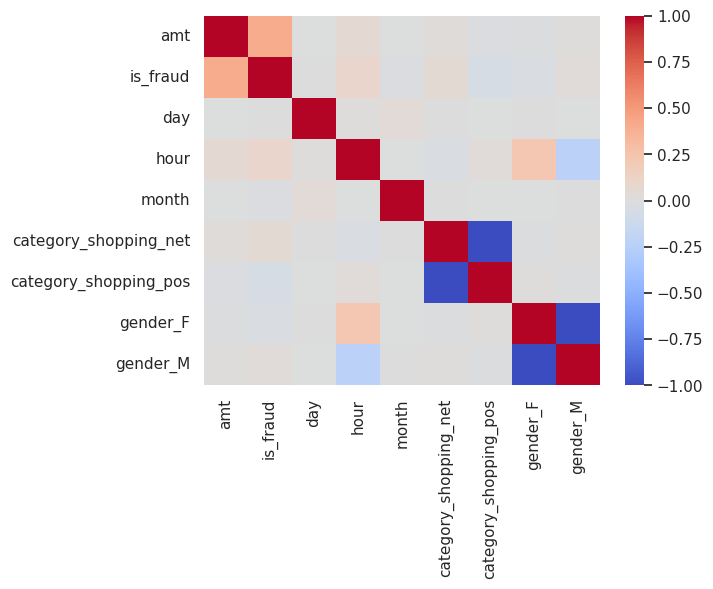

In [ ]:
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', )
plt.show()

#### Observations
1. There is a slide positive relation between amount spent and fraud possibility - the higher the amount the higher the possibility of fraud.
2. There is a very minimal relation between gender and prefered hour of shopping.
3. No real corelation between day, month and other features

Let us try to dive in some more by creating some bins.

In [ ]:
## Transaction amount
data_for_corr['amt_bin'] = pd.cut(data_for_corr['amt'], bins=[0, 100, 500, 10000], labels=['small', 'medium', 'large'])

In [ ]:
## Transaction hour
data_for_corr['hour_bin'] = pd.cut(data_for_corr['hour'], bins=[0, 6, 12, 18, 24], labels=['night', 'morning', 'afternoon', 'evening'])

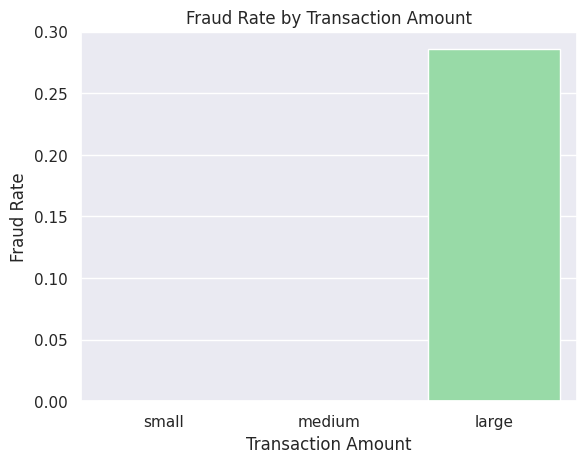

In [ ]:
fraud_rate_by_amt = data_for_corr.groupby('amt_bin')['is_fraud'].mean()
sns.barplot(x=fraud_rate_by_amt.index, y=fraud_rate_by_amt.values, palette='pastel')
plt.title('Fraud Rate by Transaction Amount')
plt.xlabel('Transaction Amount')
plt.ylabel('Fraud Rate')
plt.show()

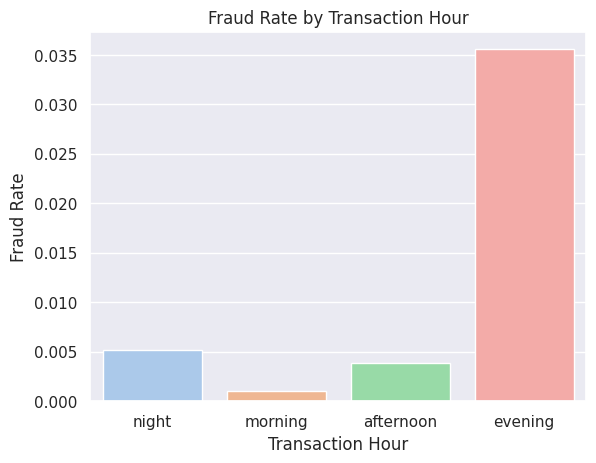

In [ ]:
fraud_rate_by_hour = data_for_corr.groupby('hour_bin')['is_fraud'].mean()
sns.barplot(x=fraud_rate_by_hour.index, y=fraud_rate_by_hour.values, palette='pastel')
plt.title('Fraud Rate by Transaction Hour')
plt.xlabel('Transaction Hour')
plt.ylabel('Fraud Rate')
plt.show()

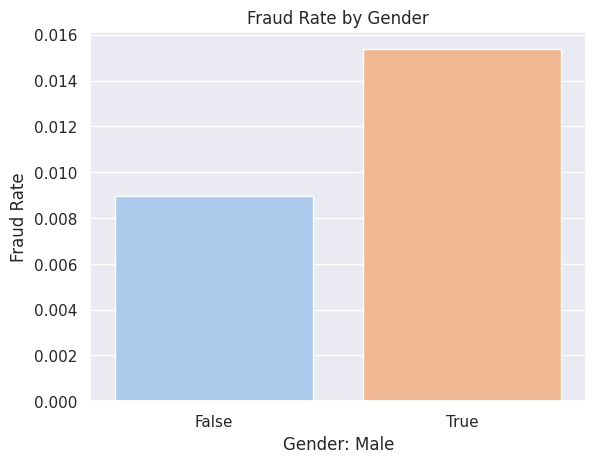

In [ ]:
fraud_rate_by_gender = data_for_corr.groupby('gender_M')['is_fraud'].mean()
sns.barplot(x=fraud_rate_by_gender.index, y=fraud_rate_by_gender.values, palette='pastel')
plt.title('Fraud Rate by Gender')
plt.xlabel('Gender: Male')
plt.ylabel('Fraud Rate')
plt.show()

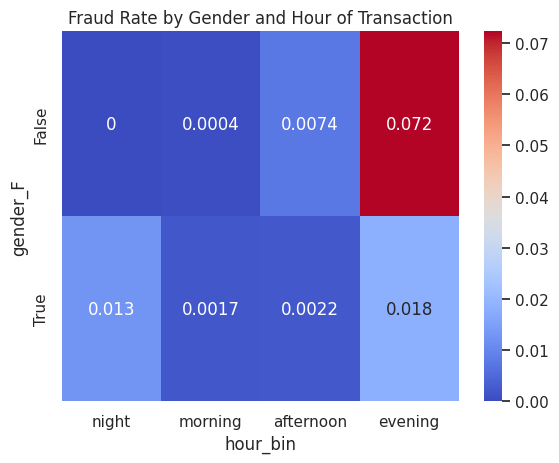

In [ ]:
fraud_rate_by_gender_category = data_for_corr.pivot_table(values='is_fraud', index='gender_F', columns='hour_bin', aggfunc='mean')
sns.heatmap(fraud_rate_by_gender_category, annot=True, cmap='coolwarm')
plt.title('Fraud Rate by Gender and Hour of Transaction')
plt.show()

This shows us that fraudlent transactions are most likely to occure on evenings and are done by males.

This brings us to the next topic which is detecting fraudlent transactions.

## Detecting fraudlent transactions

After a carefull examination of the dataset we're ready to detect fraudlent transactions.

#### Dataset preparation

First, we choose only relevant categories and create separate DataFrame to work with. For this example we will use:
1. category
2. gender
3. amt
4. trans_date_trans_time
5. state
6. is_fraud (which is our goal to detect)

**Side note:** We will only use data from 2k19

In [ ]:
fr_pred = df[['category', 'gender', 'amt', 'trans_date_trans_time', 'state', 'is_fraud']]
fr_pred = fr_pred[fr_pred.trans_date_trans_time.dt.year == 2019]

#### Further dataFrame processing

Now, we will create different columns from *trans_date_trans_time*, to extract valid information. We will add them to the df and then drop the *trans_date_trans_time* column

In [ ]:
days = fr_pred.trans_date_trans_time.dt.dayofweek
hours = fr_pred.trans_date_trans_time.dt.hour
months = fr_pred.trans_date_trans_time.dt.month

fr_pred['day'] = days
fr_pred['hour'] = hours
fr_pred['month'] = months

fr_pred = fr_pred.drop(columns=['trans_date_trans_time'])

#### Creating bins

After that we will create bins for out time. Instead of 24 hours we will create:
* **Morning** (6:00 -> 12:00)
* **Afternoon** (12:00 -> 18:00)
* **Evening** (6:00 -> 12:00)
* **Night** (12:00 -> 6:00)

In [ ]:
fr_pred['hour_bin'] = pd.cut(fr_pred['hour'], bins=[0, 6, 12, 18, 24], labels=['night', 'morning', 'afternoon', 'evening'], right=False)
fr_pred = fr_pred.drop(columns=['hour'])

In [ ]:
fr_pred = pd.get_dummies(fr_pred)

In [ ]:
X = fr_pred.drop(columns=['is_fraud'])
y = fr_pred['is_fraud']

# Convert categorical variables to dummies
X = pd.get_dummies(X, drop_first=True)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.99      1.00      1.00    183907
           1       0.01      0.00      0.00      1063

    accuracy                           0.99    184970
   macro avg       0.50      0.50      0.50    184970
weighted avg       0.99      0.99      0.99    184970



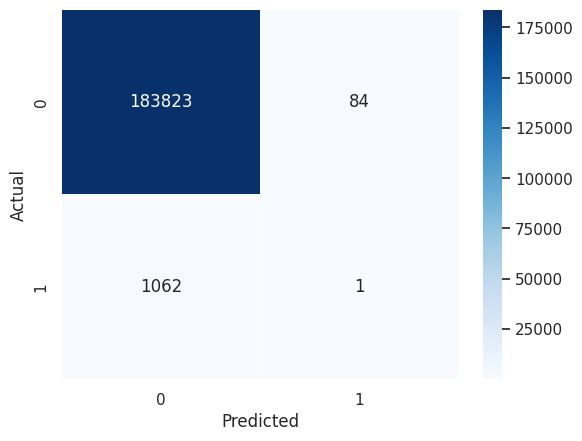

In [ ]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

The above model is not performing as well as I hoped. As for the improvements, I think that the real help here would be to:
1. Categorise different jobs into more broad topics like: tech, legal, healthcare etc.
2. Include merchant category, but to reduce the number of different labels, one could potentialy divide them into groups by their geographic location.

## Summary

That is all for now when it comes to the analysis of the following dataset. Next step would be to dig in some more into fraud detection, but I think that is beyond the scope of this paper.

Have a nice day! 👋